In [20]:
import pandas as pd
import matplotlib.pyplot as plt
import cartopy.crs as ccrs
import numpy as np
from scipy.interpolate import griddata
from matplotlib import colors
from matplotlib.colors import LogNorm, LinearSegmentedColormap


In [2]:
columns_to_read = ['x', 'y', 'tbol', 'ltim']

ls30 = pd.read_csv('ls30.tab', delimiter=',\s*', engine='python', usecols=columns_to_read)  
ls90 = pd.read_csv('ls90.tab', delimiter=',\s*', engine='python', usecols=columns_to_read)  
ls150 = pd.read_csv('ls150.tab', delimiter=',\s*', engine='python', usecols=columns_to_read)  
ls210 = pd.read_csv('ls210.tab', delimiter=',\s*', engine='python', usecols=columns_to_read)  
ls270 = pd.read_csv('ls270.tab', delimiter=',\s*', engine='python', usecols=columns_to_read)  
ls330 = pd.read_csv('ls330.tab', delimiter=',\s*', engine='python', usecols=columns_to_read)  

In [3]:
data = pd.concat([ls30, ls90, ls150, ls210, ls270, ls330], ignore_index=True)

In [4]:
data.describe()

,x,y,ltim,tbol
count,1.328997e+07,1.328997e+07,1.328997e+07,1.328997e+07
mean,-2.591371e-02,7.199237e-03,1.007407e+01,1.034283e+02
std,8.297957e-02,8.559804e-02,6.516178e+00,6.748711e+01
min,-1.749080e-01,-1.749080e-01,0.000000e+00,7.723835e+00
25%,-9.159900e-02,-6.230900e-02,4.789100e+00,6.171303e+01
50%,-3.633600e-02,1.202000e-02,8.937300e+00,7.339615e+01
75%,3.454000e-02,7.640100e-02,1.457320e+01,1.115224e+02
max,1.749080e-01,1.749080e-01,2.400000e+01,3.265851e+02


In [71]:
def preprocess(data, graph, blanks=False):
    data_using = data
    longitudes = data_using['x']
    latitudes = data_using['y']
    temperatures = data_using[graph]

    valid_indices = np.isfinite(longitudes) & np.isfinite(latitudes) & np.isfinite(temperatures)
    longitudes = longitudes[valid_indices]
    latitudes = latitudes[valid_indices]
    temperatures = temperatures[valid_indices]

    lon_min, lon_max = longitudes.min(), longitudes.max()
    lat_min, lat_max = latitudes.min(), latitudes.max()
    lon_grid = np.linspace(lon_min, lon_max, 1500)
    lat_grid = np.linspace(lat_min, lat_max, 1500)
    lon_mesh, lat_mesh = np.meshgrid(lon_grid, lat_grid)

    if blanks==True:
        print("Assigning data to grid")
        temp_grid = np.full(lon_mesh.shape, np.nan)
        for lon, lat, temp in zip(longitudes, latitudes, temperatures):
            idx_lon = np.clip(np.searchsorted(lon_grid, lon) - 1, 0, lon_mesh.shape[1] - 1)
            idx_lat = np.clip(np.searchsorted(lat_grid, lat) - 1, 0, lat_mesh.shape[0] - 1)
            temp_grid[idx_lat, idx_lon] = temp

        print("Done preprocessing")
        return lon_mesh, lat_mesh, temp_grid
        
    temp_grid = griddata((longitudes, latitudes), temperatures, (lon_mesh, lat_mesh), method='nearest')

    return lon_mesh, lat_mesh, temp_grid


combo 0
combo 1
combo 2
combo 3
combo 4
combo 5
combo 6
combo 7
combo 8
combo 9
combo 10
combo 11
combo 12
combo 13
combo 14
combo 15


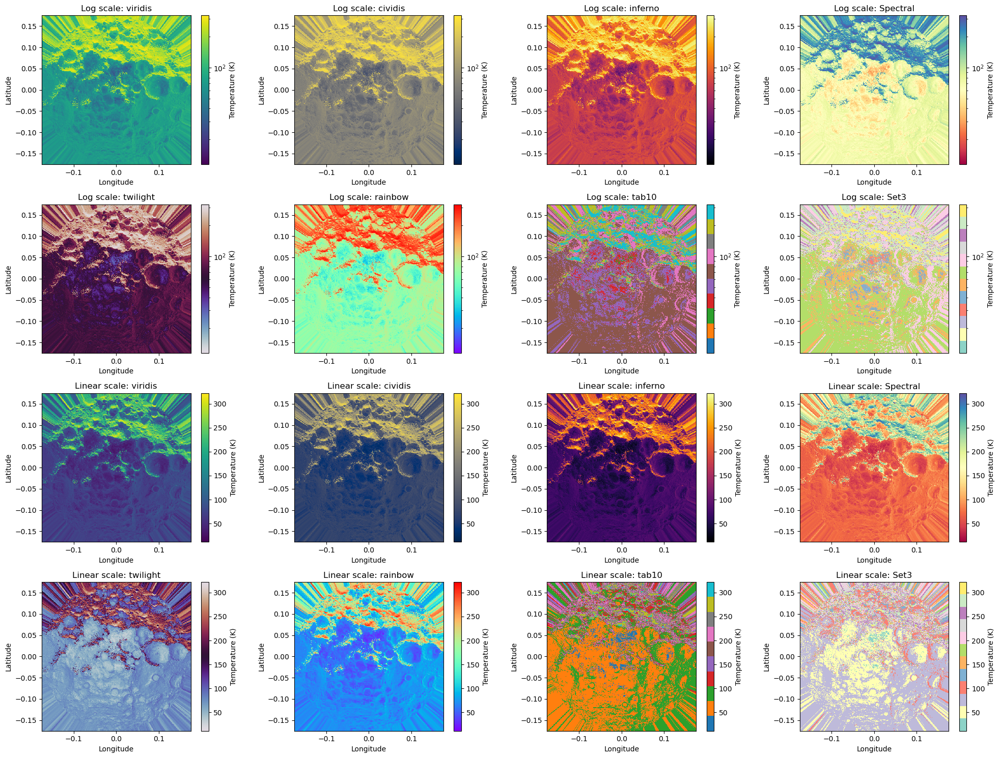

In [59]:
lon_mesh, lat_mesh, temp_grid = preprocess(data, 'tbol')

colormaps = ['viridis', 'cividis', 'inferno', 'Spectral', 'twilight', 'rainbow', 'tab10', 'Set3']

fig, axs = plt.subplots(4, 4, figsize=(20, 15))

for i, ax in enumerate(axs.flat):
    print("combo", i)

    if i < 8:  
        pcm = ax.pcolormesh(lon_mesh, lat_mesh, temp_grid, cmap=colormaps[i], norm=LogNorm(vmin=temp_grid.min(), vmax=temp_grid.max()))
        ax.set_title(f"Log scale: {colormaps[i]}")
    else:  
        pcm = ax.pcolormesh(lon_mesh, lat_mesh, temp_grid, cmap=colormaps[i - 8])
        ax.set_title(f"Linear scale: {colormaps[i - 8]}")
        
    ax.set_xlabel('Longitude')
    ax.set_ylabel('Latitude')
    fig.colorbar(pcm, ax=ax, label='Temperature (K)')
    ax.set_aspect('equal', adjustable='box')

# Display the plot
plt.tight_layout()
plt.show()


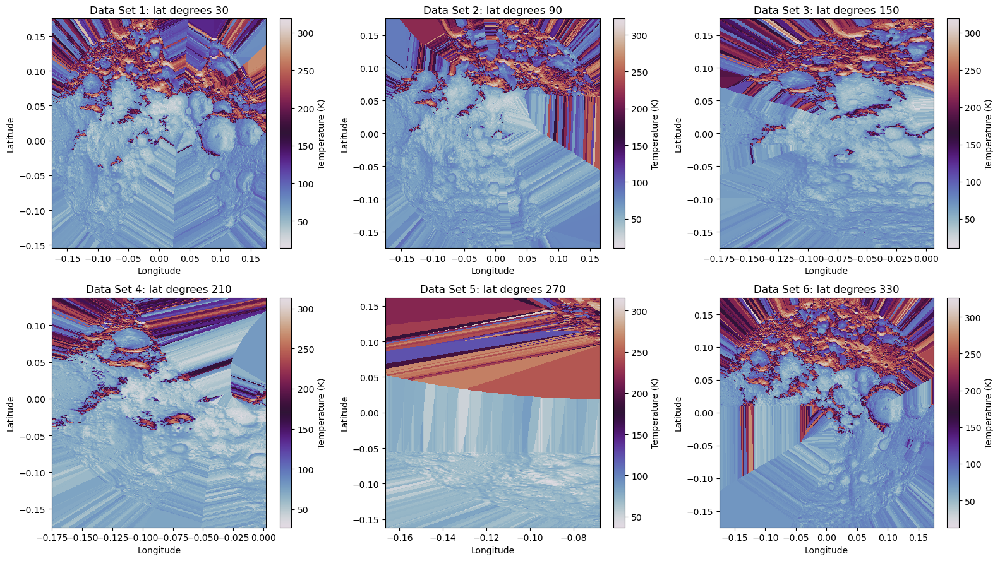

In [66]:
data_sets = [ls30, ls90, ls150, ls210, ls270, ls330]
data_names = ['30', '90', '150', '210', '270', '330']

fig, axs = plt.subplots(2, 3, figsize=(16, 9))

for i, (data_using, ax) in enumerate(zip(data_sets, axs.flat)):

    lon_mesh, lat_mesh, temp_grid = preprocess(data_using, 'tbol')

    pcm = ax.pcolormesh(lon_mesh, lat_mesh, temp_grid, cmap='twilight')
    
    ax.set_title(f"Data Set {i+1}: lat degrees {data_names[i]}")
    ax.set_xlabel('Longitude')
    ax.set_ylabel('Latitude')
    
    fig.colorbar(pcm, ax=ax, label='Temperature (K)')

# Display the plot
plt.tight_layout()
plt.show()


Assigning data to grid
up to 0.0 0.0
Done preprocessing
Assigning data to grid
up to 0.0 0.0
Done preprocessing
Assigning data to grid
up to 0.0 0.0
Done preprocessing
Assigning data to grid
Done preprocessing
Assigning data to grid
Done preprocessing
Assigning data to grid
up to 0.0 0.0
Done preprocessing


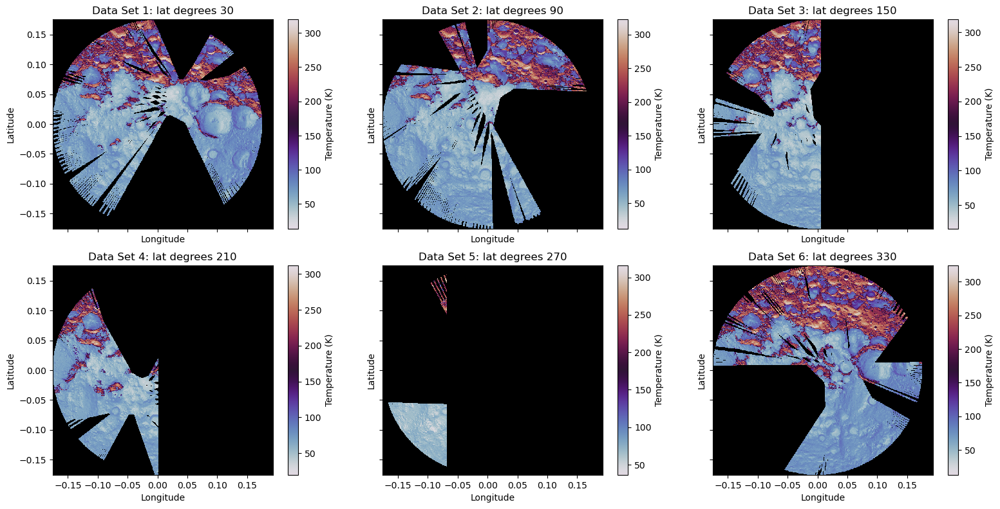

In [57]:
data_sets = [ls30, ls90, ls150, ls210, ls270, ls330]
data_names = ['30', '90', '150', '210', '270', '330']
cmap = plt.cm.twilight.copy()
cmap.set_bad(color='black')

fig, axs = plt.subplots(2, 3, figsize=(16, 8), sharex=True, sharey=True)

for i, (data_using, ax) in enumerate(zip(data_sets, axs.flat)):

    ax.set_facecolor('black')
    lon_mesh, lat_mesh, temp_grid = preprocess(data_using, 'tbol', True)

    pcm = ax.pcolormesh(lon_mesh, lat_mesh, temp_grid, cmap=cmap)
    
    ax.set_title(f"Data Set {i+1}: lat degrees {data_names[i]}")
    ax.set_xlabel('Longitude')
    ax.set_ylabel('Latitude')
    fig.colorbar(pcm, ax=ax, label='Temperature (K)')
    ax.set_aspect('equal', adjustable='box')


# Display the plot
plt.tight_layout()
plt.show()


In [36]:
each_hour = []
for i in range(24):
    print("doing", i)
    data_using = data[(data['ltim'] >= i) & (data['ltim'] < i+1)]
    lon_mesh, lat_mesh, temp_grid = preprocess(data_using, 'tbol', True)
    each_hour.append((lon_mesh, lat_mesh, temp_grid))

doing 0
Assigning data to grid
up to 0.0 0.0
up to 0.0 0.0
up to 0.0 0.0
up to 0.0 0.0
Done preprocessing
doing 1
Assigning data to grid
Done preprocessing
doing 2
Assigning data to grid
Done preprocessing
doing 3
Assigning data to grid
Done preprocessing
doing 4
Assigning data to grid
Done preprocessing
doing 5
Assigning data to grid
Done preprocessing
doing 6
Assigning data to grid
Done preprocessing
doing 7
Assigning data to grid
Done preprocessing
doing 8
Assigning data to grid
Done preprocessing
doing 9
Assigning data to grid
Done preprocessing
doing 10
Assigning data to grid
Done preprocessing
doing 11
Assigning data to grid
Done preprocessing
doing 12
Assigning data to grid
Done preprocessing
doing 13
Assigning data to grid
Done preprocessing
doing 14
Assigning data to grid
Done preprocessing
doing 15
Assigning data to grid
Done preprocessing
doing 16
Assigning data to grid
Done preprocessing
doing 17
Assigning data to grid
Done preprocessing
doing 18
Assigning data to grid
Done

In [37]:
each_hour_full = []
for i in range(24):
    print("doing", i)
    data_using = data[(data['ltim'] >= i) & (data['ltim'] < i+1)]
    lon_mesh, lat_mesh, temp_grid = preprocess(data_using, 'tbol')
    each_hour_full.append((lon_mesh, lat_mesh, temp_grid))

doing 0
doing 1
doing 2
doing 3
doing 4
doing 5
doing 6
doing 7
doing 8
doing 9
doing 10
doing 11
doing 12
doing 13
doing 14
doing 15
doing 16
doing 17
doing 18
doing 19
doing 20
doing 21
doing 22
doing 23


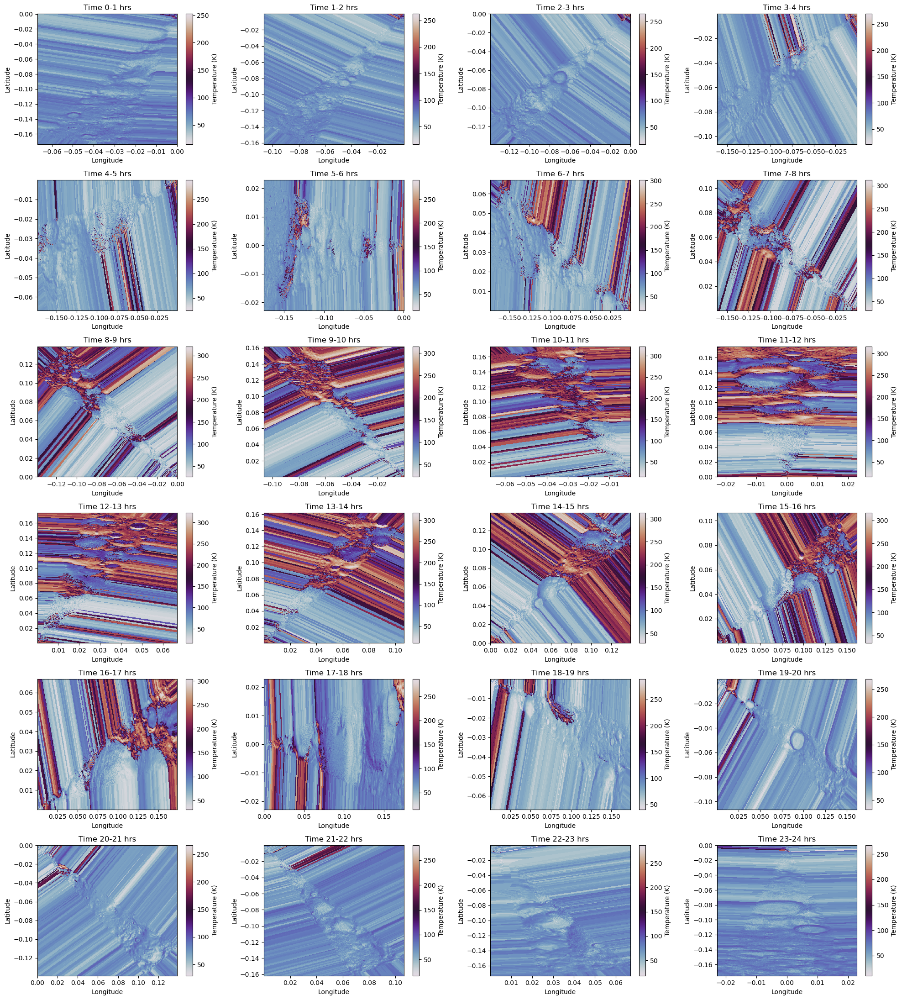

In [65]:
fig, axs = plt.subplots(6, 4, figsize=(20, 22))

time_intervals = [(i, i+1) for i in range(24)] 

for i, ax in enumerate(axs.flat):
    time_range = time_intervals[i] 
        
    lon_mesh, lat_mesh, temp_grid = each_hour_full[i]
    
    pcm = ax.pcolormesh(lon_mesh, lat_mesh, temp_grid, cmap='twilight')
    
    ax.set_title(f"Time {time_range[0]}-{time_range[1]} hrs")
    ax.set_xlabel('Longitude')
    ax.set_ylabel('Latitude')
    fig.colorbar(pcm, ax=ax, label='Temperature (K)')

plt.tight_layout()
plt.show()


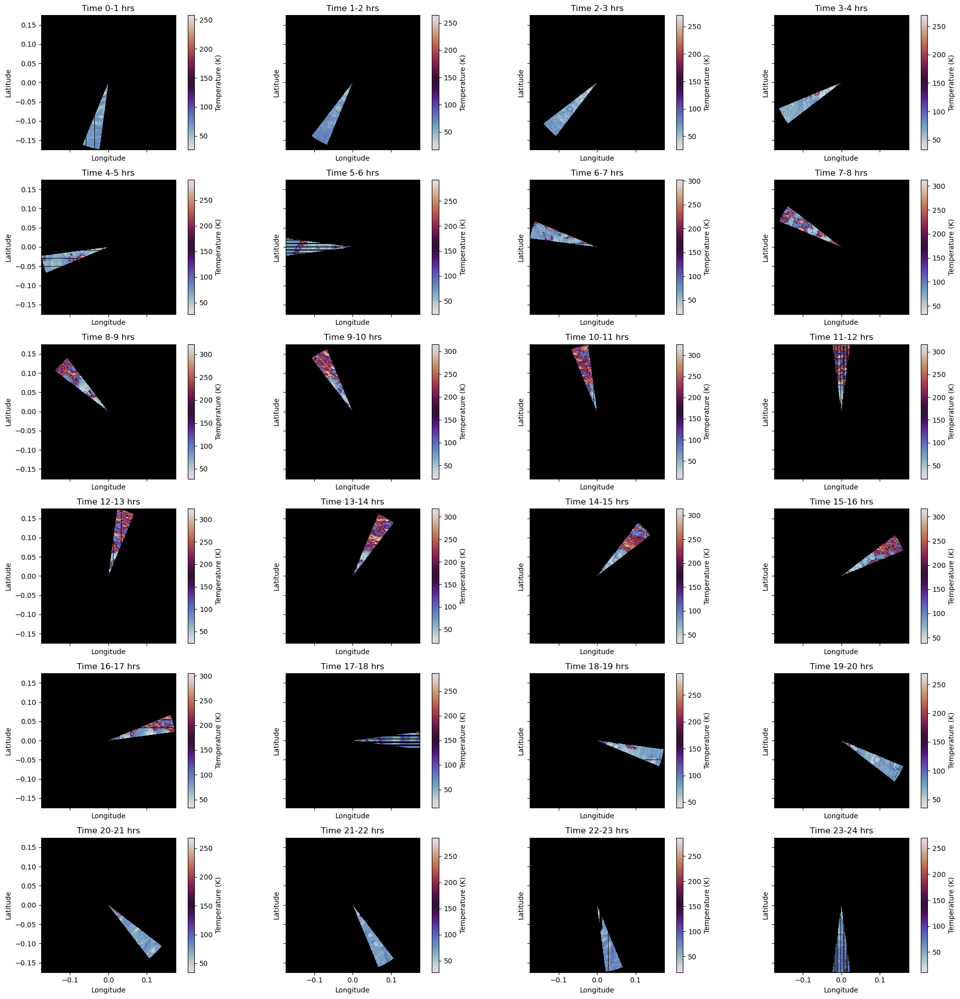

In [67]:
cmap = plt.cm.twilight.copy()
cmap.set_bad(color='black')

fig, axs = plt.subplots(6, 4, figsize=(20, 20), sharex=True, sharey=True)

time_intervals = [(i, i+1) for i in range(24)]  

for i, ax in enumerate(axs.flat):
    ax.set_facecolor('black')

    time_range = time_intervals[i]      
    lon_mesh, lat_mesh, temp_grid = each_hour[i]    
    pcm = ax.pcolormesh(lon_mesh, lat_mesh, temp_grid, cmap=cmap)
    
    ax.set_title(f"Time {time_range[0]}-{time_range[1]} hrs")
    ax.set_xlabel('Longitude')
    ax.set_ylabel('Latitude')  
    ax.set_aspect('equal', adjustable='box')

    fig.colorbar(pcm, ax=ax, label='Temperature (K)')

plt.tight_layout()
plt.show()


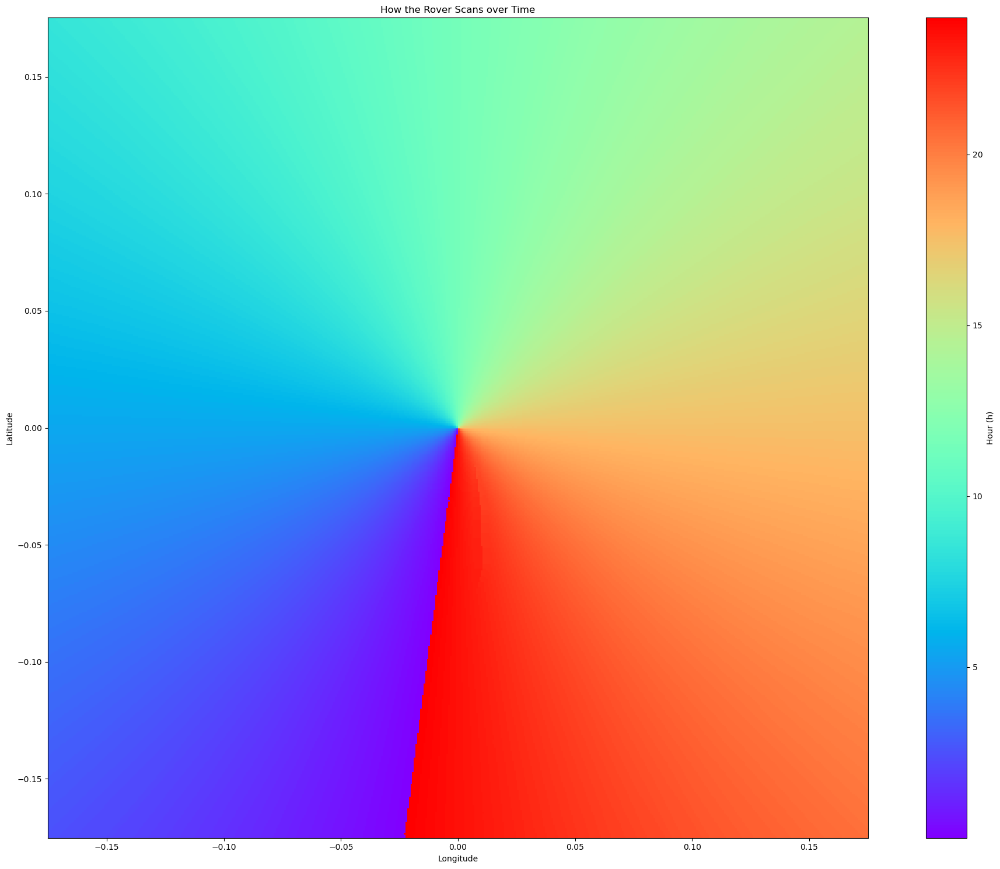

In [54]:
lon_mesh, lat_mesh, times_grid = preprocess(data,'ltim')

fig, ax = plt.subplots(figsize=(20, 15))

pcm = ax.pcolormesh(lon_mesh, lat_mesh, times_grid, cmap='rainbow')
ax.set_title(f"How the Rover Scans over Time")

ax.set_aspect('equal', adjustable='box')
ax.set_xlabel('Longitude')
ax.set_ylabel('Latitude')
fig.colorbar(pcm, ax=ax, label='Hour (h)')

# Display the plot
plt.tight_layout()
plt.show()

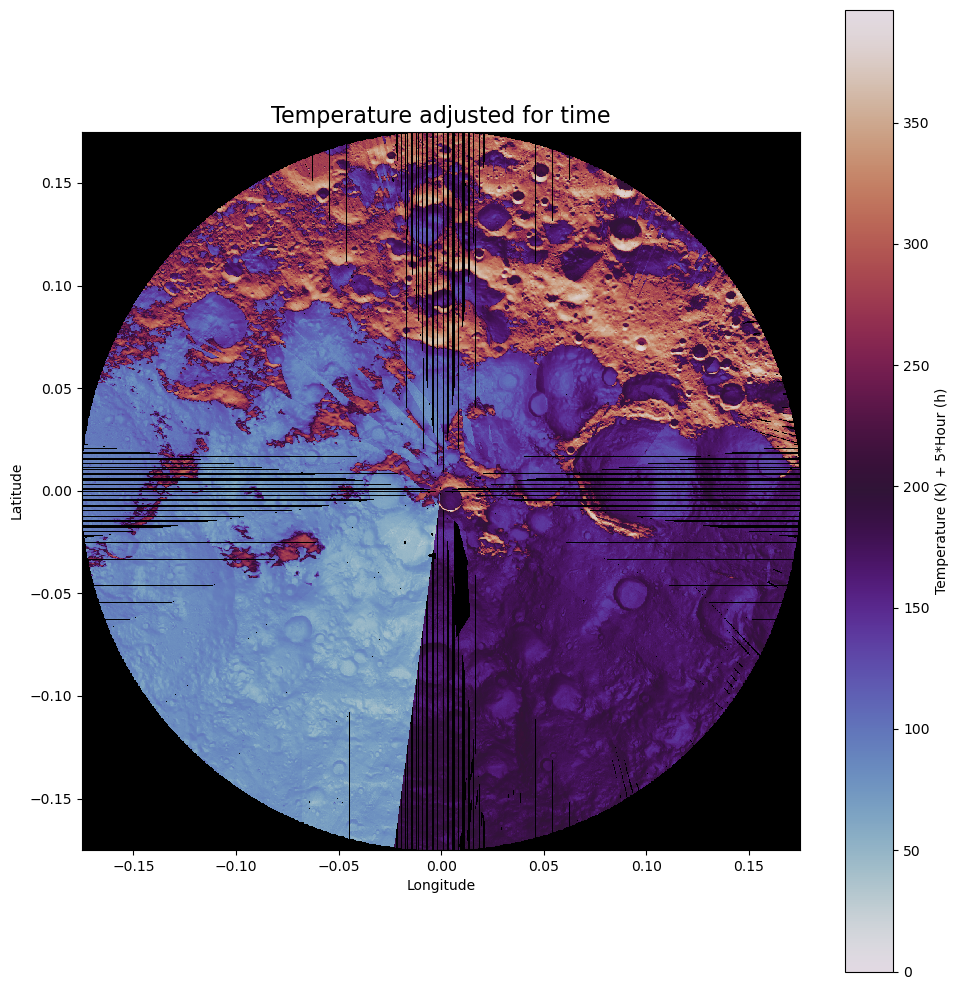

In [64]:
fig, ax = plt.subplots(figsize=(10, 10))
ax.set_facecolor('black')

time_intervals = [(i, i + 1) for i in range(24)]

global_min = 0
global_max = float('-inf')

for hour, time_range in enumerate(time_intervals):
    lon_mesh, lat_mesh, temp_grid = each_hour[hour]    
    temp_grid = np.nan_to_num(temp_grid, nan=0)
    temp_grid_adjusted = temp_grid + (hour * 5)
    global_max = max(global_max, temp_grid_adjusted.max())

for i, time_range in enumerate(time_intervals):
    lon_mesh, lat_mesh, temp_grid = each_hour[i]    
    temp_grid_adjusted = temp_grid + (i * 5)
    pcm = ax.pcolormesh(lon_mesh, lat_mesh, temp_grid_adjusted, cmap="twilight", shading='auto', vmin=global_min, vmax=global_max)

ax.set_aspect('equal', adjustable='box')
ax.set_title("Temperature adjusted for time", fontsize=16)
ax.set_xlabel("Longitude")
ax.set_ylabel("Latitude")
fig.colorbar(pcm, ax=ax, label='Temperature (K) + 5*Hour (h)')
plt.tight_layout()
plt.show()


In [74]:
lon_mesh, lat_mesh, temp_grid = preprocess(data, 'tbol')

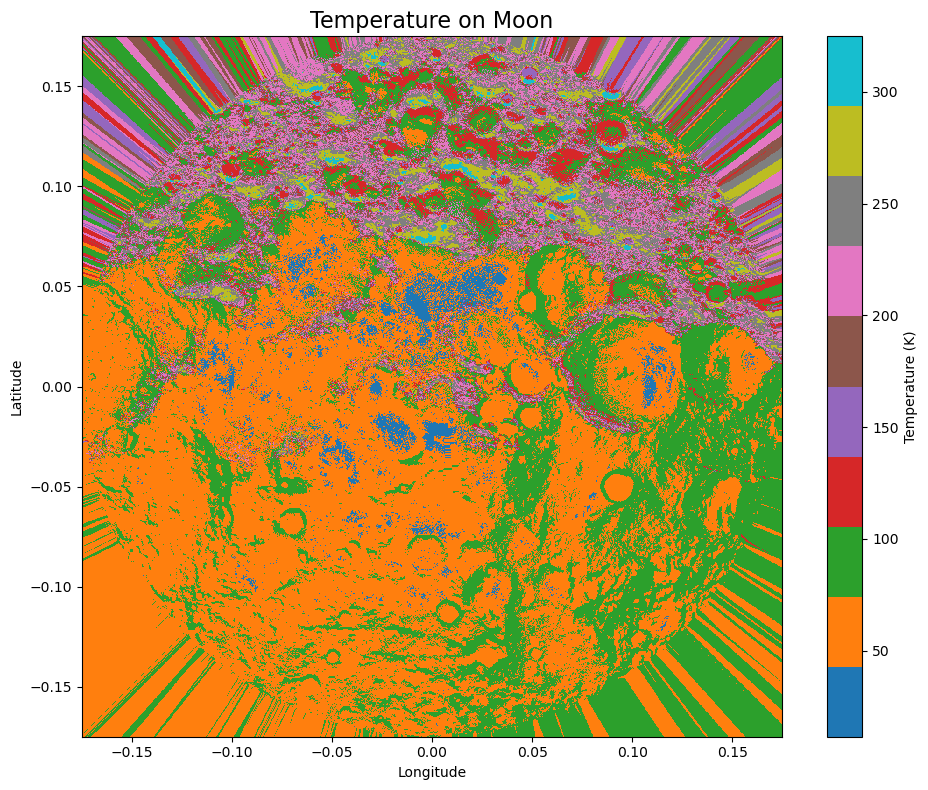

In [79]:
fig, ax = plt.subplots(figsize=(10, 8))

       
pcm = ax.pcolormesh(lon_mesh, lat_mesh, temp_grid, cmap='tab10')

ax.set_aspect('equal', adjustable='box')
ax.set_title("Temperature on Moon", fontsize=16)
ax.set_xlabel("Longitude")
ax.set_ylabel("Latitude")
fig.colorbar(pcm, ax=ax, label='Temperature (K)')
plt.tight_layout()
plt.show()